In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms, models
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, f1_score, precision_score, recall_score
import timm
from tqdm.notebook import tqdm
import cv2

/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
DATA_DIR = "/kaggle/input/wildfirenet/WildfireNet"
OUT_DIR = "./"
BATCH_SIZE = 32
EPOCHS = 40
PATIENCE = 5
N_CLASSES = 3

In [4]:
train_tfms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomResizedCrop(224, scale=(0.7,1.0)),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2),
    transforms.GaussianBlur(5, sigma=(0.1,2.0)),
    transforms.RandomPerspective(distortion_scale=0.3, p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
])


In [5]:
val_tfms = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
])


In [6]:
dataset = datasets.ImageFolder(DATA_DIR)

In [7]:
total_size = len(dataset)
test_size = int(0.15 * total_size)
val_size = int(0.15 * total_size)
train_size = total_size - val_size - test_size

train_set, val_set, test_set = random_split(dataset, [train_size, val_size, test_size])

In [8]:
train_set.dataset.transform = train_tfms
val_set.dataset.transform = val_tfms
test_set.dataset.transform = val_tfms

train_loader = DataLoader(train_set, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

In [9]:
class_names = dataset.classes
print("Class mapping:", dataset.class_to_idx)

Class mapping: {'fire': 0, 'no_fire': 1, 'smoke': 2}


In [10]:
model = models.efficientnet_b0(pretrained=True)
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.classifier[1].in_features, N_CLASSES)
)
model = model.to(device)
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 152MB/s]


In [11]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [12]:
train_losses, val_losses = [], []
train_accs, val_accs = [], []
best_val_loss = np.inf
wait = 0

In [13]:
for epoch in range(EPOCHS):
    model.train()
    running_loss, correct, total = 0,0,0
    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1} Training"):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()*images.size(0)
        _, preds = torch.max(outputs,1)
        correct += (preds==labels).sum().item()
        total += labels.size(0)
    train_loss = running_loss/total
    train_acc = correct/total

    model.eval()
    running_loss, correct, total = 0,0,0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()*images.size(0)
            _, preds = torch.max(outputs,1)
            correct += (preds==labels).sum().item()
            total += labels.size(0)
    val_loss = running_loss/total
    val_acc = correct/total

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)

    scheduler.step(val_loss)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), f"{OUT_DIR}/best_model.pth")
        wait = 0
    else:
        wait += 1
        if wait >= PATIENCE:
            print(f"Early stopping at epoch {epoch+1}")
            break

    print(f"Epoch [{epoch+1}/{EPOCHS}] "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

Epoch 1 Training:   0%|          | 0/66 [00:00<?, ?it/s]

Epoch [1/40] Train Loss: 0.6141, Train Acc: 0.7930 | Val Loss: 0.2286, Val Acc: 0.9310


Epoch 2 Training:   0%|          | 0/66 [00:00<?, ?it/s]

Epoch [2/40] Train Loss: 0.2129, Train Acc: 0.9323 | Val Loss: 0.1440, Val Acc: 0.9577


Epoch 3 Training:   0%|          | 0/66 [00:00<?, ?it/s]

Epoch [3/40] Train Loss: 0.1186, Train Acc: 0.9604 | Val Loss: 0.1291, Val Acc: 0.9666


Epoch 4 Training:   0%|          | 0/66 [00:00<?, ?it/s]

Epoch [4/40] Train Loss: 0.0752, Train Acc: 0.9752 | Val Loss: 0.1258, Val Acc: 0.9621


Epoch 5 Training:   0%|          | 0/66 [00:00<?, ?it/s]

Epoch [5/40] Train Loss: 0.0506, Train Acc: 0.9843 | Val Loss: 0.1231, Val Acc: 0.9644


Epoch 6 Training:   0%|          | 0/66 [00:00<?, ?it/s]

Epoch [6/40] Train Loss: 0.0367, Train Acc: 0.9905 | Val Loss: 0.1310, Val Acc: 0.9688


Epoch 7 Training:   0%|          | 0/66 [00:00<?, ?it/s]

Epoch [7/40] Train Loss: 0.0265, Train Acc: 0.9924 | Val Loss: 0.1459, Val Acc: 0.9621


Epoch 8 Training:   0%|          | 0/66 [00:00<?, ?it/s]

Epoch [8/40] Train Loss: 0.0236, Train Acc: 0.9933 | Val Loss: 0.1431, Val Acc: 0.9644


Epoch 9 Training:   0%|          | 0/66 [00:00<?, ?it/s]

Epoch [9/40] Train Loss: 0.0150, Train Acc: 0.9971 | Val Loss: 0.1450, Val Acc: 0.9644


Epoch 10 Training:   0%|          | 0/66 [00:00<?, ?it/s]

Early stopping at epoch 10


In [14]:
model.load_state_dict(torch.load(f"{OUT_DIR}/best_model.pth"))

<All keys matched successfully>

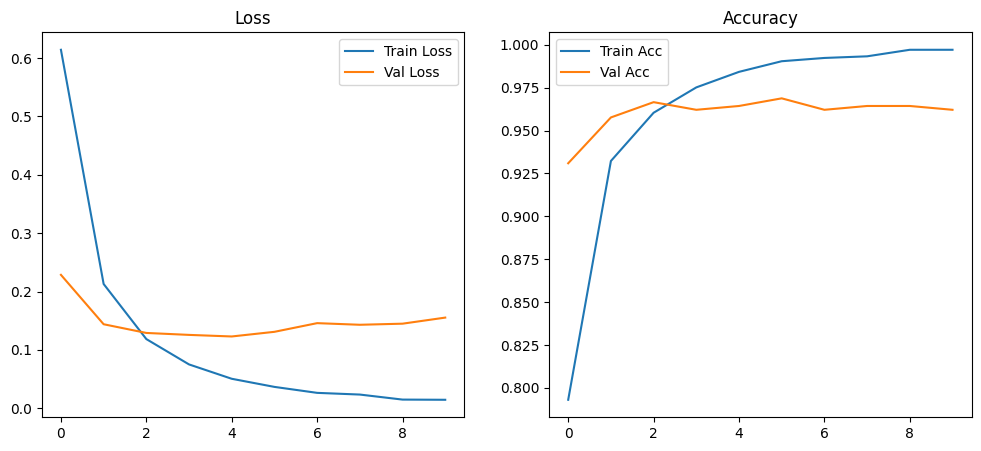

In [15]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(train_losses,label="Train Loss")
plt.plot(val_losses,label="Val Loss")
plt.legend(); plt.title("Loss")
plt.subplot(1,2,2)
plt.plot(train_accs,label="Train Acc")
plt.plot(val_accs,label="Val Acc")
plt.legend(); plt.title("Accuracy")
plt.show()

In [16]:
y_true, y_pred = [], []
model.eval()
with torch.no_grad():
    for images, labels in tqdm(test_loader, desc="Testing"):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs,1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())


Testing:   0%|          | 0/15 [00:00<?, ?it/s]

Classification Report:

              precision    recall  f1-score   support

        fire       0.96      0.96      0.96       119
     no_fire       0.95      0.95      0.95       164
       smoke       0.95      0.95      0.95       166

    accuracy                           0.95       449
   macro avg       0.95      0.95      0.95       449
weighted avg       0.95      0.95      0.95       449



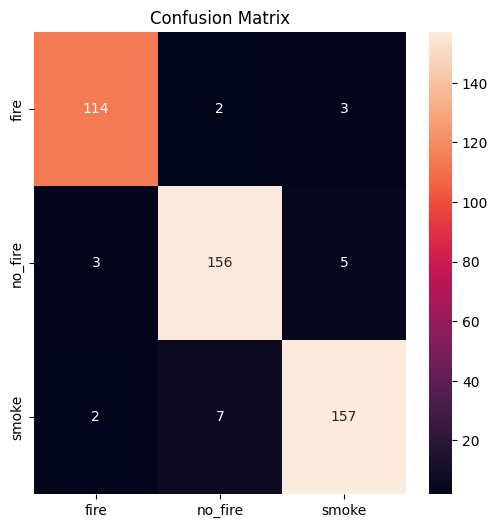

In [17]:
print("Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.show()

In [19]:
precision = precision_score(y_true, y_pred, average=None)
recall = recall_score(y_true, y_pred, average=None)
f1 = f1_score(y_true, y_pred, average=None)

precision_macro = precision_score(y_true, y_pred, average='macro')
recall_macro = recall_score(y_true, y_pred, average='macro')
f1_macro = f1_score(y_true, y_pred, average='macro')

print("Per-Class Metrics")
for i, cls in enumerate(class_names):
    print(f"{cls}: Precision={precision[i]:.4f}, Recall={recall[i]:.4f}, F1={f1[i]:.4f}")

print("\nMacro-Averaged (Overall) Metrics")
print(f"Macro Precision: {precision_macro:.4f}")
print(f"Macro Recall:    {recall_macro:.4f}")
print(f"Macro F1 Score:  {f1_macro:.4f}")

Per-Class Metrics
fire: Precision=0.9580, Recall=0.9580, F1=0.9580
no_fire: Precision=0.9455, Recall=0.9512, F1=0.9483
smoke: Precision=0.9515, Recall=0.9458, F1=0.9486

Macro-Averaged (Overall) Metrics
Macro Precision: 0.9517
Macro Recall:    0.9517
Macro F1 Score:  0.9517


In [30]:
import torch
import torch.nn as nn
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [31]:
def grad_cam(model, img_tensor, target_class):
    model.eval()
    
    gradients = []
    activations = []

    def backward_hook(module, grad_in, grad_out):
        gradients.append(grad_out[0].detach())

    def forward_hook(module, input, output):
        activations.append(output.detach())

    target_layer = model.features[-1][-1]  
    forward_handle = target_layer.register_forward_hook(forward_hook)
    backward_handle = target_layer.register_backward_hook(backward_hook)

    img_tensor = img_tensor.unsqueeze(0).to(device)
    pred = model(img_tensor)
    model.zero_grad()
    loss = pred[0, target_class]
    loss.backward()

    grads = gradients[0].cpu().numpy()[0]
    acts = activations[0].cpu().numpy()[0]
    weights = np.mean(grads, axis=(1,2))
    cam = np.zeros(acts.shape[1:], dtype=np.float32)
    for i, w in enumerate(weights):
        cam += w * acts[i]
    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (224,224))
    cam = cam - np.min(cam)
    cam = cam / np.max(cam)

    forward_handle.remove()
    backward_handle.remove()

    return cam

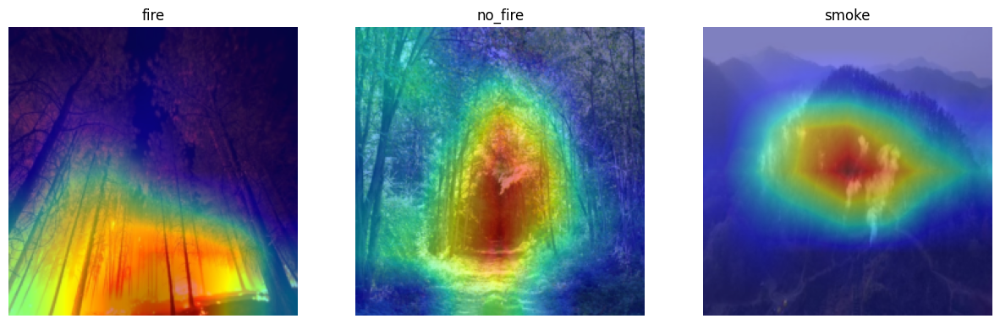

In [33]:
fig, axs = plt.subplots(1, N_CLASSES, figsize=(15,5))
for class_idx in range(N_CLASSES):
    for img, label in test_set:
        if label == class_idx:
            break

    cam = grad_cam(model, img, class_idx)

    img_np = img.permute(1,2,0).numpy()
    img_np = img_np * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
    img_np = np.clip(img_np,0,1)

    axs[class_idx].imshow(img_np)
    axs[class_idx].imshow(cam, cmap='jet', alpha=0.5)
    axs[class_idx].set_title(class_names[class_idx])
    axs[class_idx].axis('off')

plt.show()

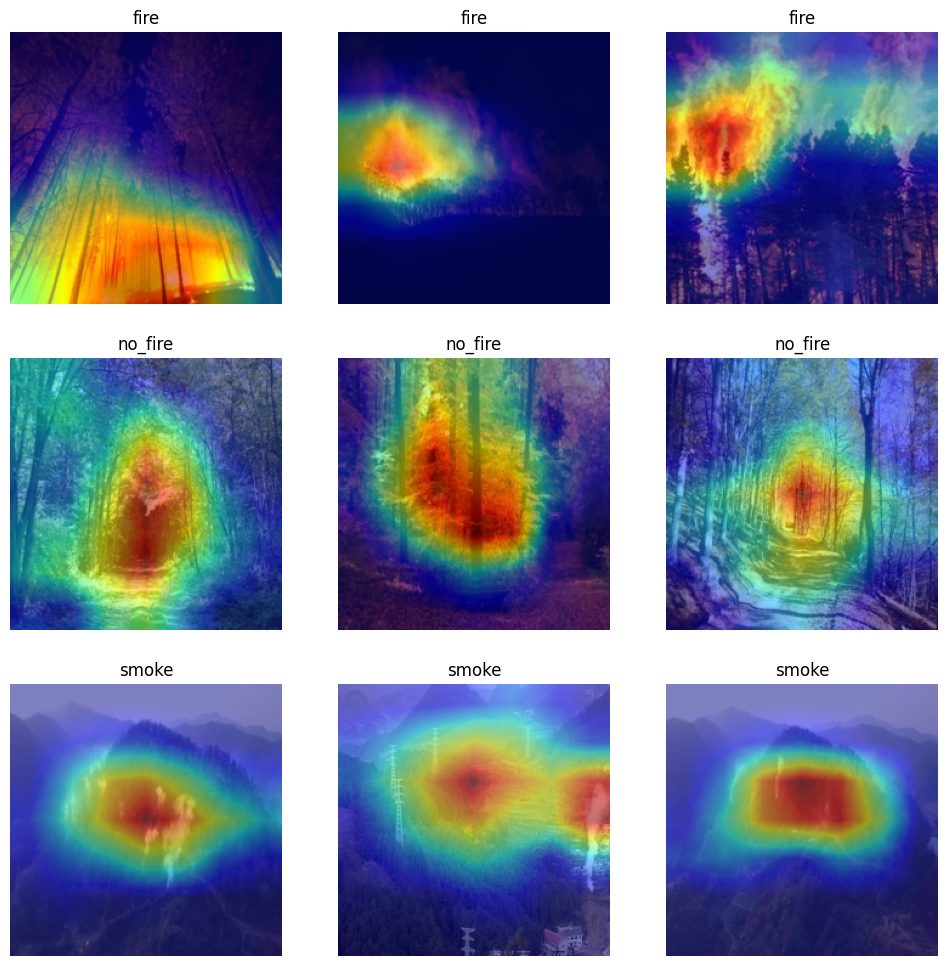

In [35]:
fig, axs = plt.subplots(N_CLASSES, 3, figsize=(12,12))
for class_idx in range(N_CLASSES):
    class_imgs = [img for img, label in test_set if label == class_idx][:3]  
    for j, img in enumerate(class_imgs):
        cam = grad_cam(model, img, class_idx)

        img_np = img.permute(1,2,0).numpy()
        img_np = img_np * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
        img_np = np.clip(img_np,0,1)

        axs[class_idx, j].imshow(img_np)
        axs[class_idx, j].imshow(cam, cmap='jet', alpha=0.5)
        axs[class_idx, j].set_title(f"{class_names[class_idx]}")
        axs[class_idx, j].axis('off')
plt.show()

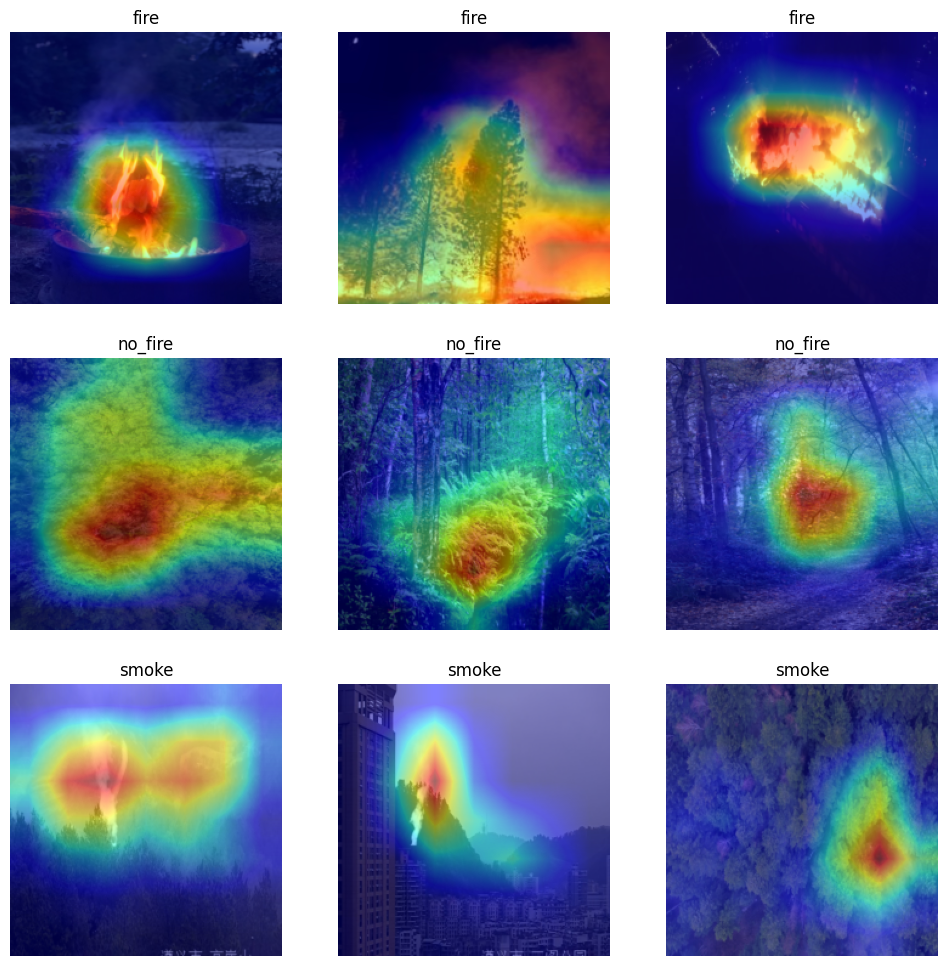

In [36]:
fig, axs = plt.subplots(N_CLASSES, 3, figsize=(12,12))
for class_idx in range(N_CLASSES):
    class_imgs = [img for img, label in test_set if label == class_idx][6:9]  
    for j, img in enumerate(class_imgs):
        cam = grad_cam(model, img, class_idx)

        img_np = img.permute(1,2,0).numpy()
        img_np = img_np * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
        img_np = np.clip(img_np,0,1)

        axs[class_idx, j].imshow(img_np)
        axs[class_idx, j].imshow(cam, cmap='jet', alpha=0.5)
        axs[class_idx, j].set_title(f"{class_names[class_idx]}")
        axs[class_idx, j].axis('off')
plt.show()

In [37]:
import random

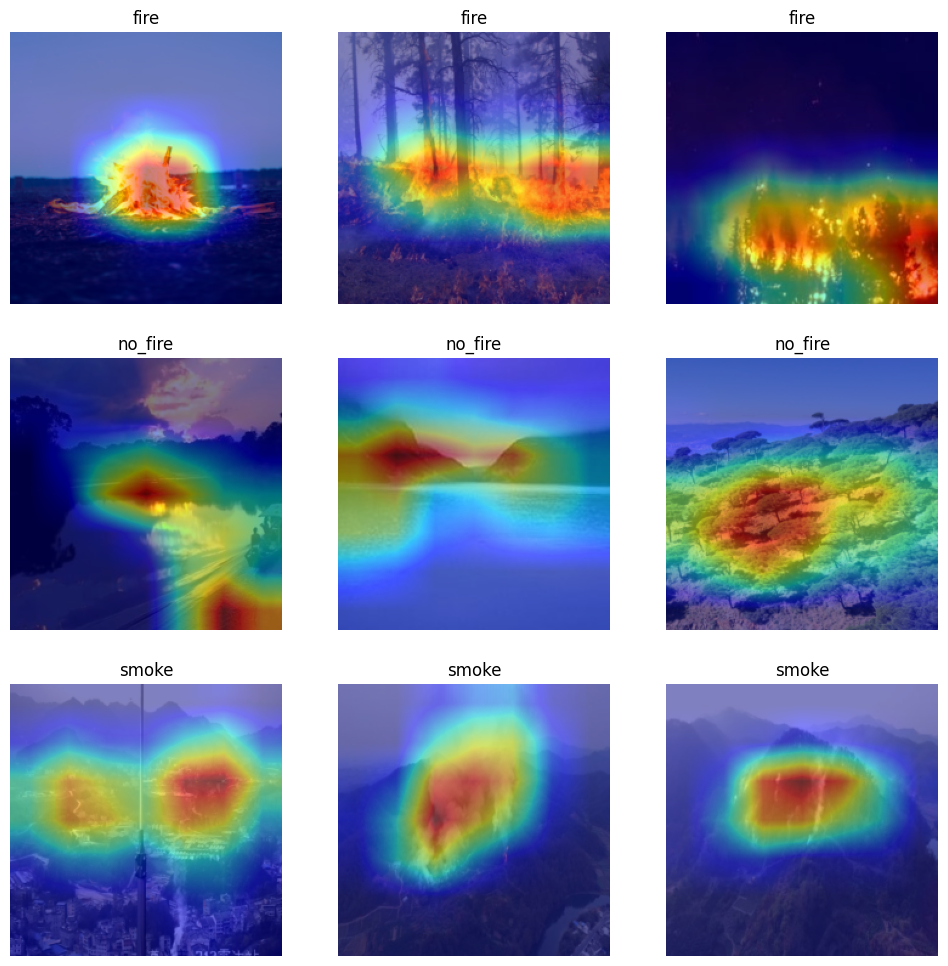

In [38]:
fig, axs = plt.subplots(N_CLASSES, 3, figsize=(12,12))
for class_idx in range(N_CLASSES):
    class_imgs_all = [img for img, label in test_set if label == class_idx]
    class_imgs = random.sample(class_imgs_all, 3)
    for j, img in enumerate(class_imgs):
        cam = grad_cam(model, img, class_idx)

        img_np = img.permute(1,2,0).numpy()
        img_np = img_np * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
        img_np = np.clip(img_np,0,1)

        axs[class_idx, j].imshow(img_np)
        axs[class_idx, j].imshow(cam, cmap='jet', alpha=0.5)
        axs[class_idx, j].set_title(f"{class_names[class_idx]}")
        axs[class_idx, j].axis('off')
plt.show()

In [47]:
def imshow(img, title, ax):
    img = img.permute(1,2,0).numpy()
    img = img * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
    img = np.clip(img,0,1)
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')

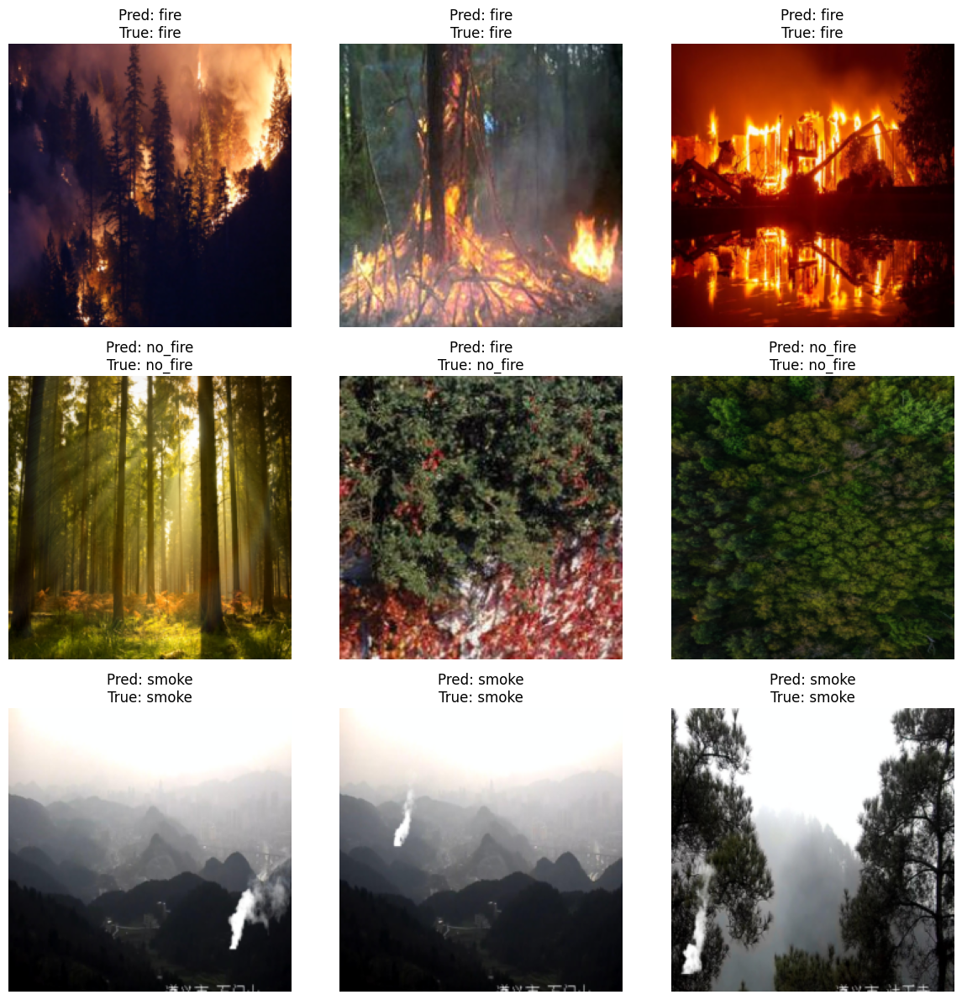

In [49]:
class_to_subset_indices = {i: [] for i in range(N_CLASSES)}
for subset_idx, dataset_idx in enumerate(test_set.indices):
    _, label = test_set.dataset.imgs[dataset_idx]
    class_to_subset_indices[label].append(subset_idx)

fig, axs = plt.subplots(N_CLASSES, 3, figsize=(12, 12))
axs = axs.flatten()  

for class_idx in range(N_CLASSES):
    sampled_subset_indices = random.sample(class_to_subset_indices[class_idx], 3)
    for j, subset_idx in enumerate(sampled_subset_indices):
        img, label = test_set[subset_idx]
        pred_label = y_pred[subset_idx]
        true_label = label
        ax_idx = class_idx*3 + j
        imshow(img, f"Pred: {class_names[pred_label]}\nTrue: {class_names[true_label]}", axs[ax_idx])

plt.tight_layout()
plt.show()

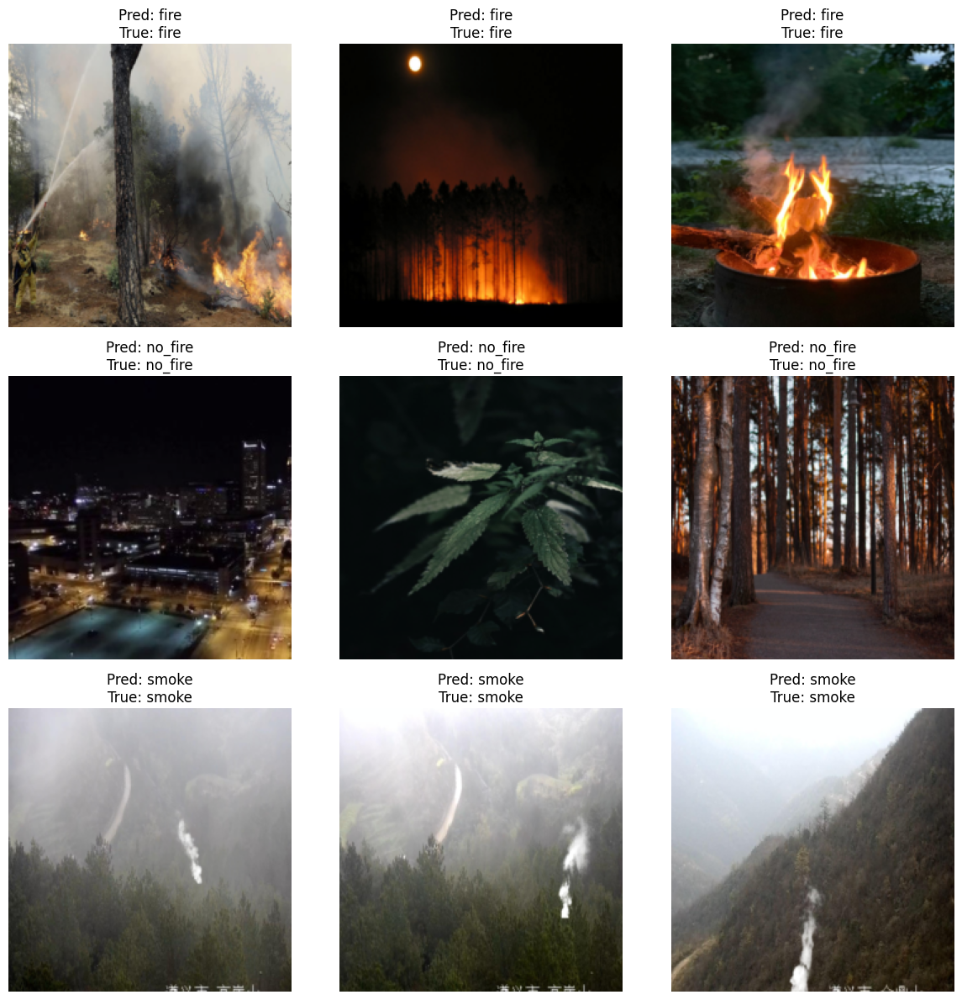

In [50]:
class_to_subset_indices = {i: [] for i in range(N_CLASSES)}
for subset_idx, dataset_idx in enumerate(test_set.indices):
    _, label = test_set.dataset.imgs[dataset_idx]
    class_to_subset_indices[label].append(subset_idx)

fig, axs = plt.subplots(N_CLASSES, 3, figsize=(12, 12))
axs = axs.flatten()  

for class_idx in range(N_CLASSES):
    sampled_subset_indices = random.sample(class_to_subset_indices[class_idx], 3)
    for j, subset_idx in enumerate(sampled_subset_indices):
        img, label = test_set[subset_idx]
        pred_label = y_pred[subset_idx]
        true_label = label
        ax_idx = class_idx*3 + j
        imshow(img, f"Pred: {class_names[pred_label]}\nTrue: {class_names[true_label]}", axs[ax_idx])

plt.tight_layout()
plt.show()

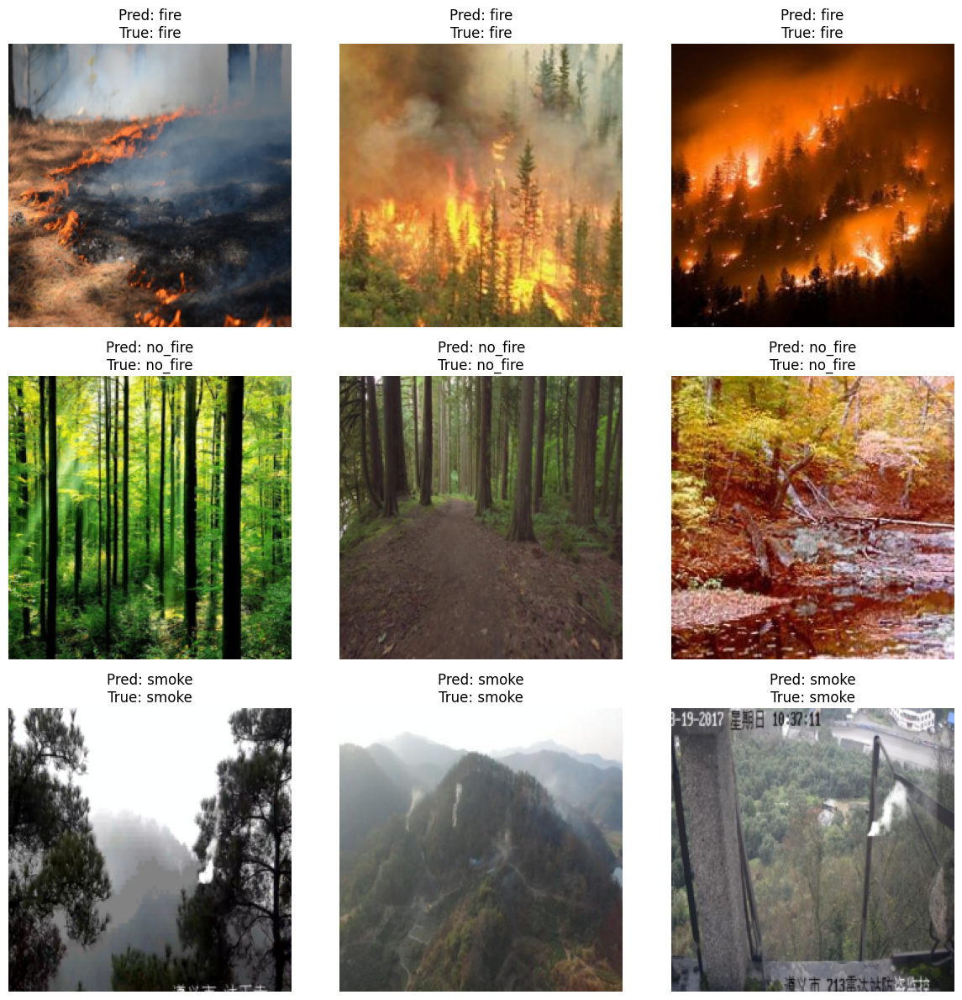

In [51]:
class_to_subset_indices = {i: [] for i in range(N_CLASSES)}
for subset_idx, dataset_idx in enumerate(test_set.indices):
    _, label = test_set.dataset.imgs[dataset_idx]
    class_to_subset_indices[label].append(subset_idx)

fig, axs = plt.subplots(N_CLASSES, 3, figsize=(12, 12))
axs = axs.flatten()  

for class_idx in range(N_CLASSES):
    sampled_subset_indices = random.sample(class_to_subset_indices[class_idx], 3)
    for j, subset_idx in enumerate(sampled_subset_indices):
        img, label = test_set[subset_idx]
        pred_label = y_pred[subset_idx]
        true_label = label
        ax_idx = class_idx*3 + j
        imshow(img, f"Pred: {class_names[pred_label]}\nTrue: {class_names[true_label]}", axs[ax_idx])

plt.tight_layout()
plt.show()

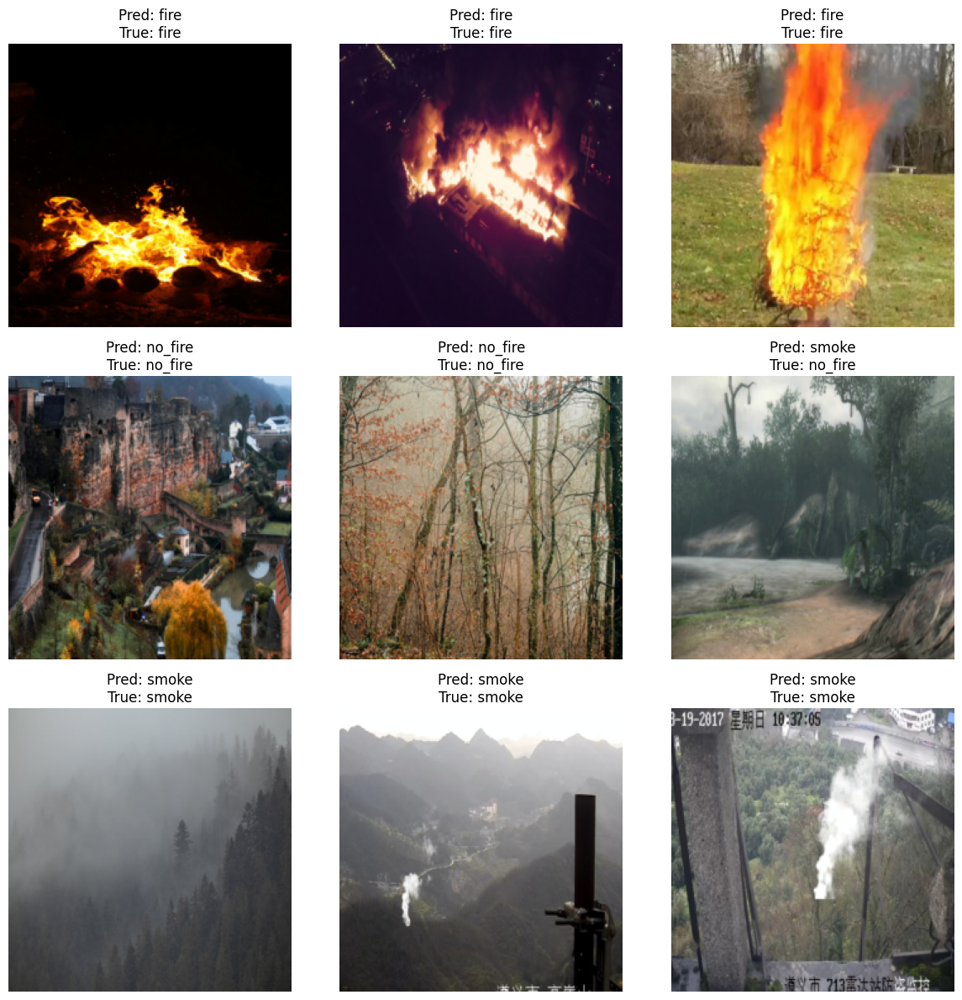

In [53]:
class_to_subset_indices = {i: [] for i in range(N_CLASSES)}
for subset_idx, dataset_idx in enumerate(test_set.indices):
    _, label = test_set.dataset.imgs[dataset_idx]
    class_to_subset_indices[label].append(subset_idx)

fig, axs = plt.subplots(N_CLASSES, 3, figsize=(12, 12))
axs = axs.flatten()  

for class_idx in range(N_CLASSES):
    sampled_subset_indices = random.sample(class_to_subset_indices[class_idx], 3)
    for j, subset_idx in enumerate(sampled_subset_indices):
        img, label = test_set[subset_idx]
        pred_label = y_pred[subset_idx]
        true_label = label
        ax_idx = class_idx*3 + j
        imshow(img, f"Pred: {class_names[pred_label]}\nTrue: {class_names[true_label]}", axs[ax_idx])

plt.tight_layout()
plt.show()

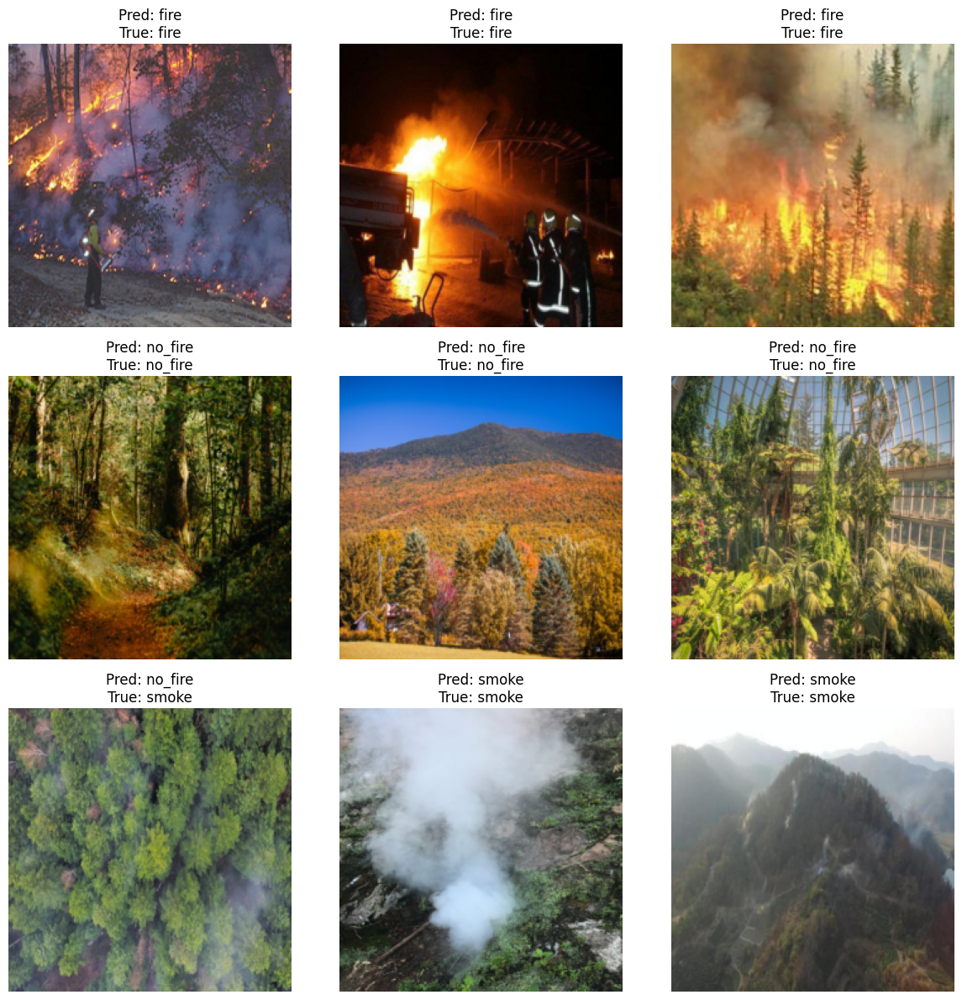

In [54]:
class_to_subset_indices = {i: [] for i in range(N_CLASSES)}
for subset_idx, dataset_idx in enumerate(test_set.indices):
    _, label = test_set.dataset.imgs[dataset_idx]
    class_to_subset_indices[label].append(subset_idx)

fig, axs = plt.subplots(N_CLASSES, 3, figsize=(12, 12))
axs = axs.flatten()  

for class_idx in range(N_CLASSES):
    sampled_subset_indices = random.sample(class_to_subset_indices[class_idx], 3)
    for j, subset_idx in enumerate(sampled_subset_indices):
        img, label = test_set[subset_idx]
        pred_label = y_pred[subset_idx]
        true_label = label
        ax_idx = class_idx*3 + j
        imshow(img, f"Pred: {class_names[pred_label]}\nTrue: {class_names[true_label]}", axs[ax_idx])

plt.tight_layout()
plt.show()

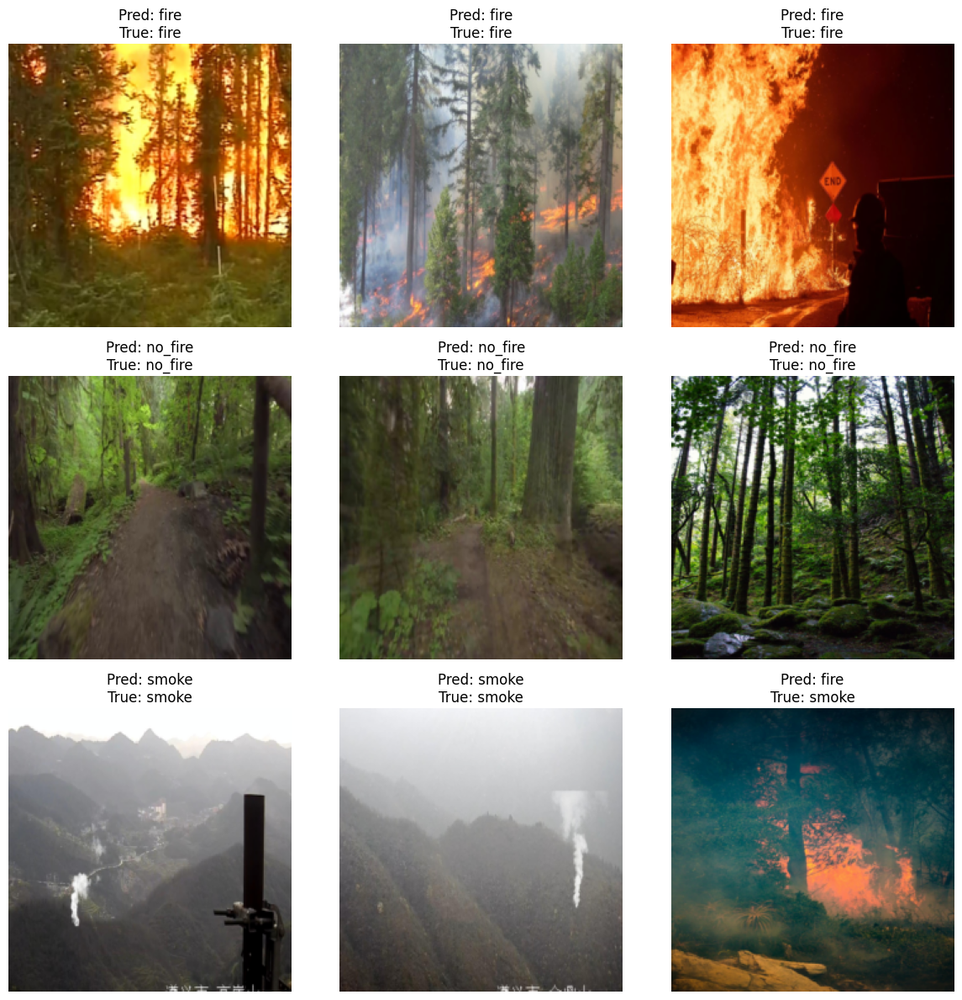

In [55]:
class_to_subset_indices = {i: [] for i in range(N_CLASSES)}
for subset_idx, dataset_idx in enumerate(test_set.indices):
    _, label = test_set.dataset.imgs[dataset_idx]
    class_to_subset_indices[label].append(subset_idx)

fig, axs = plt.subplots(N_CLASSES, 3, figsize=(12, 12))
axs = axs.flatten()  

for class_idx in range(N_CLASSES):
    sampled_subset_indices = random.sample(class_to_subset_indices[class_idx], 3)
    for j, subset_idx in enumerate(sampled_subset_indices):
        img, label = test_set[subset_idx]
        pred_label = y_pred[subset_idx]
        true_label = label
        ax_idx = class_idx*3 + j
        imshow(img, f"Pred: {class_names[pred_label]}\nTrue: {class_names[true_label]}", axs[ax_idx])

plt.tight_layout()
plt.show()

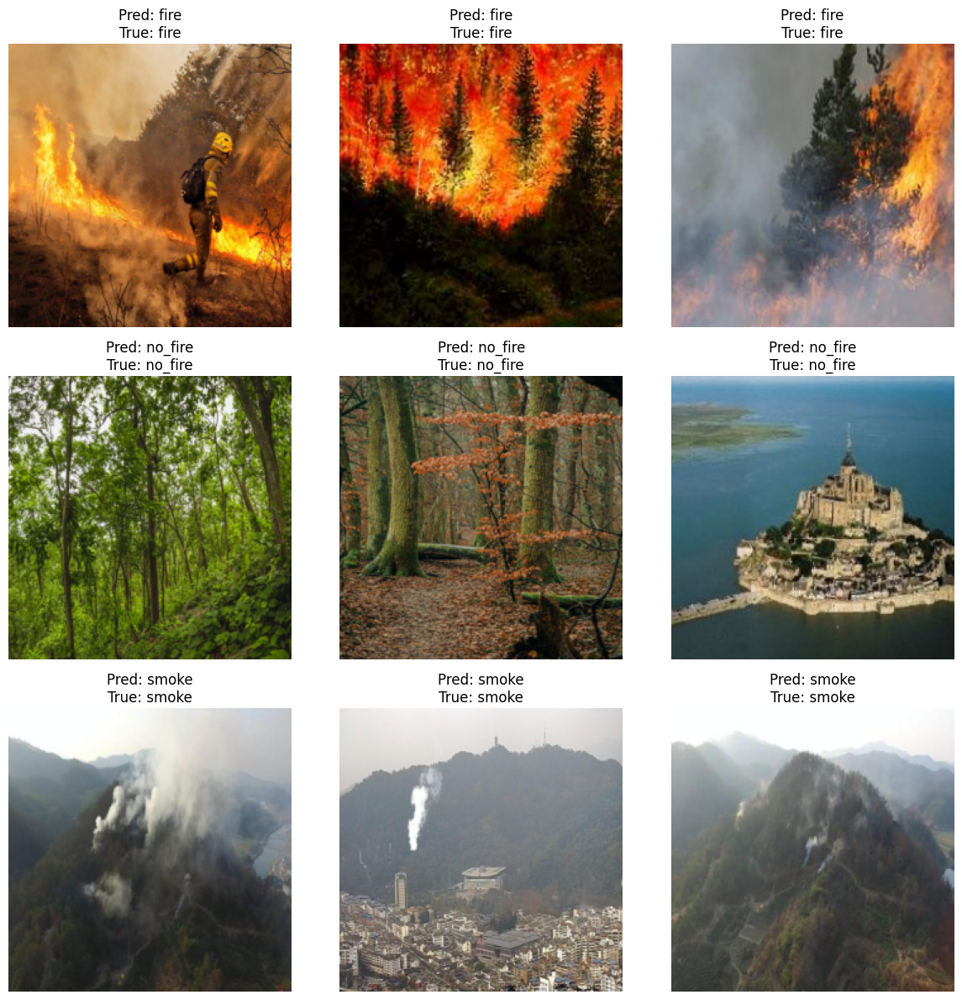

In [56]:
class_to_subset_indices = {i: [] for i in range(N_CLASSES)}
for subset_idx, dataset_idx in enumerate(test_set.indices):
    _, label = test_set.dataset.imgs[dataset_idx]
    class_to_subset_indices[label].append(subset_idx)

fig, axs = plt.subplots(N_CLASSES, 3, figsize=(12, 12))
axs = axs.flatten()  

for class_idx in range(N_CLASSES):
    sampled_subset_indices = random.sample(class_to_subset_indices[class_idx], 3)
    for j, subset_idx in enumerate(sampled_subset_indices):
        img, label = test_set[subset_idx]
        pred_label = y_pred[subset_idx]
        true_label = label
        ax_idx = class_idx*3 + j
        imshow(img, f"Pred: {class_names[pred_label]}\nTrue: {class_names[true_label]}", axs[ax_idx])

plt.tight_layout()
plt.show()